In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import prophet 
import warnings 
warnings.filterwarnings("ignore")

In [2]:
# Loading the data from CSV File
data_del_temp = pd.read_csv('delhi.csv')
data_del_temp.head(1)

,date_time,maxtempC,mintempC,totalSnow_cm,sunHour,uvIndex,uvIndex.1,moon_illumination,moonrise,moonset,...,WindChillC,WindGustKmph,cloudcover,humidity,precipMM,pressure,tempC,visibility,winddirDegree,windspeedKmph
0,2009-01-01 00:00:00,22,9,0.0,8.7,4,1,31,10:11 AM,09:57 PM,...,14,19,0,50,0.0,1016,10,10,331,12


In [3]:
# Checking the Properties of Dataset
data_del_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96432 entries, 0 to 96431
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   date_time          96432 non-null  object 
 1   maxtempC           96432 non-null  int64  
 2   mintempC           96432 non-null  int64  
 3   totalSnow_cm       96432 non-null  float64
 4   sunHour            96432 non-null  float64
 5   uvIndex            96432 non-null  int64  
 6   uvIndex.1          96432 non-null  int64  
 7   moon_illumination  96432 non-null  int64  
 8   moonrise           96432 non-null  object 
 9   moonset            96432 non-null  object 
 10  sunrise            96432 non-null  object 
 11  sunset             96432 non-null  object 
 12  DewPointC          96432 non-null  int64  
 13  FeelsLikeC         96432 non-null  int64  
 14  HeatIndexC         96432 non-null  int64  
 15  WindChillC         96432 non-null  int64  
 16  WindGustKmph       964

In [4]:
# Extracting require data
df_del_temp = data_del_temp.iloc[:,[0,1]]

In [5]:
# Check Unique date
print("Count of Unique date :",df_del_temp['date_time'].nunique())

Count of Unique date : 96432


In [6]:
#Checking missing value in df 
df_del_temp.isnull().sum()

date_time    0
maxtempC     0
dtype: int64

In [7]:
# Checking datatype of "date_time" column
df_del_temp['date_time'].dtype      # o - object

dtype('O')

In [8]:
#Convert datatype in date
df_del_temp['date_time']  = pd.to_datetime(df_del_temp['date_time'])
df_del_temp['date_time'].dtype

dtype('<M8[ns]')

In [9]:
#Adding year Column in "df_del_temp" DataFrame
df_del_temp['Year']= df_del_temp['date_time'].dt.year

## Data Analysis

In [10]:
df_del_temp.describe().T

,count,mean,std,min,25%,50%,75%,max
maxtempC,96432.0,32.681434,7.479931,12.0,26.0,34.0,38.0,52.0
Year,96432.0,2014.001493,3.162845,2009.0,2011.0,2014.0,2017.0,2020.0


#### Q1. find the date when delhi have maximum temp Between 2009 -2020

In [11]:
df_max_temp = df_del_temp.sort_values(by = 'maxtempC', ascending = False).head(1)

print(f"Delhi have maximum temp on : {df_max_temp['date_time']}")

Delhi have maximum temp on : 92029   2019-07-02 13:00:00
Name: date_time, dtype: datetime64[ns]


#### Q2. find the date when delhi have minmum temp from 2009 -2020

In [12]:
df_min_temp = df_del_temp.sort_values(by = 'maxtempC', ascending = True).head(1)

print(f"Delhi have minmum temp on : {df_min_temp['date_time']}")

Delhi have minmum temp on : 8808   2010-01-03
Name: date_time, dtype: datetime64[ns]


#### Q3. find Average of 'maxtempC' for every year?

In [13]:
df_del_temp.groupby(df_del_temp['Year']).mean()['maxtempC']

Year
2009    33.287671
2010    32.706849
2011    31.249315
2012    31.937158
2013    32.268493
2014    32.312329
2015    32.156164
2016    33.087432
2017    33.167123
2018    33.090411
2019    34.271233
2020    19.000000
Name: maxtempC, dtype: float64

#### Q4. find most ocurr temp from 2009 -2020

In [14]:
df_del_temp['maxtempC'].mode()

0    36
Name: maxtempC, dtype: int64

#### Q5. how many day have 36 degree Celcius Temperature?

In [15]:
len(df_del_temp[df_del_temp['maxtempC'] == 36])

6144

## Data Visualisation 

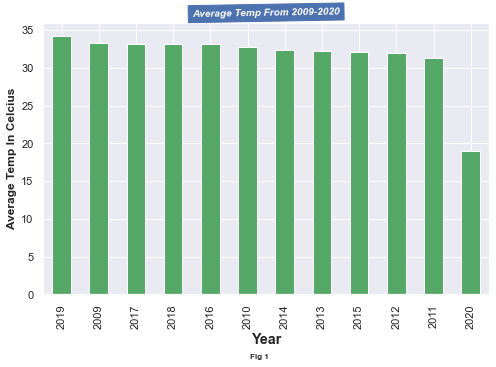

In [16]:
sns.set_theme(style="darkgrid") # white, dark, whitegrid, darkgrid,
color = ["b","r","g","c","m","y","b","r","g","c","m","y"]
plt.figure(figsize = (8,5))
df_del_temp.groupby(df_del_temp['Year']).mean()['maxtempC'].sort_values(ascending = False).plot(kind = 'bar',
                                                                                                color = "g")
plt.title("Average Temp From 2009-2020",
          fontsize = '10',
          fontweight = 'bold',
          backgroundcolor = 'b', 
          color= 'w',
          rotation = 1,
          fontstyle = 'oblique',
          loc = 'center')

plt.suptitle("Fig 1",y = -0.04,fontweight = 'bold',fontsize = '8')
plt.xlabel('Year',fontweight = 'bold',size = 'large')
plt.ylabel('Average Temp In Celcius',fontweight = 'bold')
plt.show()

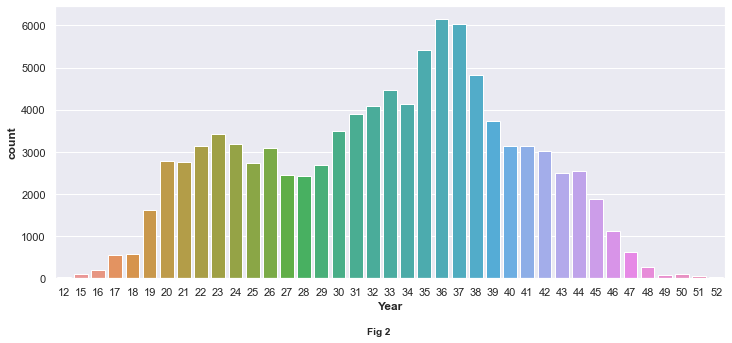

In [17]:
plt.figure(figsize = (12,5))
sns.countplot(df_del_temp['maxtempC'])
plt.suptitle("Fig 2",y = -0.01,fontsize = '10',fontweight = 'bold')
plt.xlabel("Year",fontweight = 'bold',backgroundcolor = "w",size = 'medium')
plt.ylabel("count",fontweight = 'bold',backgroundcolor = "w",size = 'medium')
plt.show()

## Time Series Analysis

In [18]:
model = prophet.Prophet()

In [19]:
# Data preparation - Extracting desire columns and rename as ds and y
data = df_del_temp.iloc[:,[0,1]].rename(columns = {'date_time' : 'ds','maxtempC' : 'y'})
data = data.iloc[61368:87648,:]
data.head(2)

,ds,y
61368,2016-01-02 00:00:00,23
61369,2016-01-02 01:00:00,23


In [20]:
model.fit(data)

13:36:00 - cmdstanpy - INFO - Chain [1] start processing
13:36:51 - cmdstanpy - INFO - Chain [1] done processing


In [21]:
future = model.make_future_dataframe(periods = 365,freq = "D")
future.tail(2)

,ds
26643,2019-12-30 23:00:00
26644,2019-12-31 23:00:00


In [22]:
data.shape, future.shape

((26280, 2), (26645, 1))

In [23]:
forcast = model.predict(future)
forcast.tail(2)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
26643,2019-12-30 23:00:00,24.693256,-13.095168,39.825228,-2.001421,49.496709,-10.357539,-10.357539,-10.357539,0.000444,...,-0.017095,-0.017095,-0.017095,-10.340888,-10.340888,-10.340888,0.0,0.0,0.0,14.335718
26644,2019-12-31 23:00:00,24.676835,-13.461045,39.063410,-2.077833,49.637267,-10.356448,-10.356448,-10.356448,0.000444,...,0.084801,0.084801,0.084801,-10.441694,-10.441694,-10.441694,0.0,0.0,0.0,14.320387


In [24]:
forcast_data = forcast[['ds','yhat','yhat_lower','yhat_upper']]
forcast_data.tail(2)

,ds,yhat,yhat_lower,yhat_upper
26643,2019-12-30 23:00:00,14.335718,-13.095168,39.825228
26644,2019-12-31 23:00:00,14.320387,-13.461045,39.063410


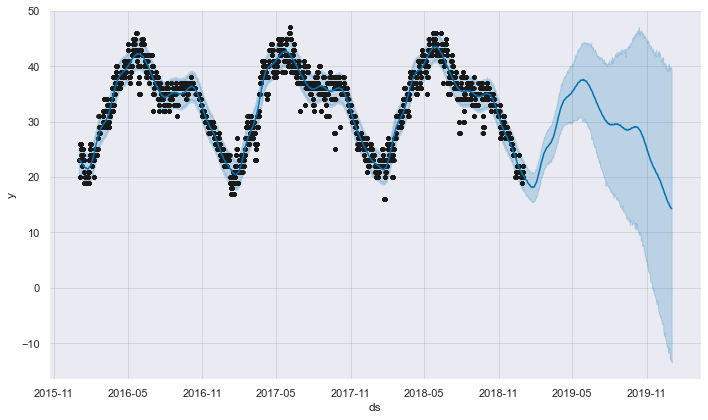

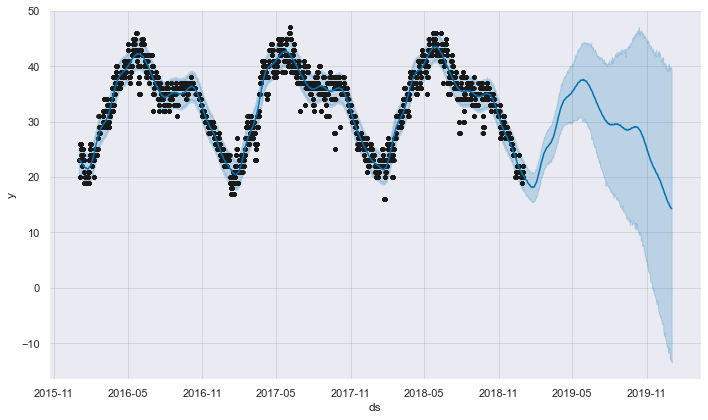

In [25]:
model.plot(forcast_data)

In [30]:
from prophet.plot import plot_plotly, plot_components_plotly
plot_plotly(model, forcast_data)

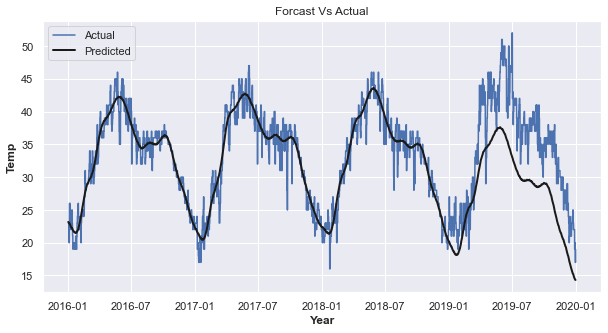

In [27]:
df_Actual = df_del_temp.iloc[61368:96409,[0,1]] #61368 87648
plt.figure(figsize = (10,5))
plt.plot(df_Actual['date_time'],df_Actual['maxtempC'],label = 'Actual',color='b')
plt.plot(forcast_data['ds'],forcast_data['yhat'],label = 'Predicted',c='k',linewidth=2)
plt.title("Forcast Vs Actual")
plt.xlabel("Year",fontweight = 'bold',size = 'medium')
plt.ylabel("Temp",fontweight = 'bold',size = 'medium')
plt.legend()
plt.show()

In [28]:
import plotly.graph_objs as go
Forcast_df_del_temp = forcast_data.iloc[26280:,[0,1]]
Actual_df_del_temp = df_del_temp.iloc[87648:96408,[0,1]]
fig1 = px.line(x = Actual_df_del_temp['date_time'],y = Actual_df_del_temp['maxtempC'],
               title = 'Actual')
fig2 = px.line(x = Forcast_df_del_temp['ds'],y = Forcast_df_del_temp['yhat'],
               title = 'Predicted')
fig = go.Figure(data = fig1.data + fig2.data)
fig.show()

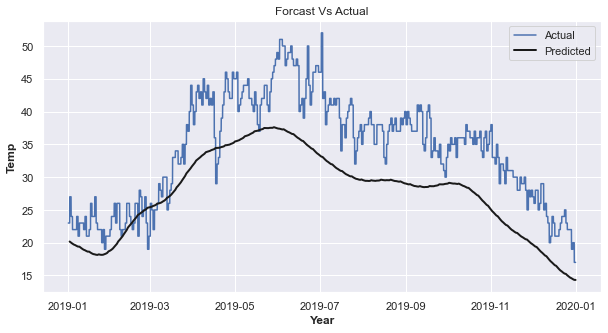

In [29]:
plt.figure(figsize = (10,5))
plt.plot(Actual_df_del_temp['date_time'],Actual_df_del_temp['maxtempC'],label = 'Actual',color='b')
plt.plot(Forcast_df_del_temp['ds'],Forcast_df_del_temp['yhat'],label = 'Predicted',c='k',linewidth=2)
plt.title("Forcast Vs Actual")
plt.xlabel("Year",fontweight = 'bold',size = 'medium')
plt.ylabel("Temp",fontweight = 'bold',size = 'medium')
plt.legend()
plt.show()




In [ ]:
def perticular